In [7]:
# Importing Libraries
import torch
import torch.nn.functional as F
from torch import nn
import pandas as pd
import matplotlib.pyplot as plt # for making figures
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from pprint import pprint
import random
import torch._dynamo
torch._dynamo.config.suppress_errors = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

In [11]:
# Dataset
f = open("input.txt",'r')
text = f.read()
text = text.lower()

In [5]:
# Tokenizing break
text = text.replace("\n","~")

In [12]:
# Text to words

words = text.split()

# build the vocabulary of characters and mappings to/from integers
chars = sorted(list(set(words)))
stoi = {s:i for i,s in enumerate(chars)}
# stoi['~'] = 0
itos = {i:s for s,i in stoi.items()}
pprint(itos)

{0: '&c.',
 1: '&c:',
 2: "'",
 3: "'?",
 4: "'a",
 5: "'aged",
 6: "'alas,",
 7: "'alas,'",
 8: "'all",
 9: "'alla",
 10: "'almost",
 11: "'an",
 12: "'ay",
 13: "'ay'",
 14: "'ay,",
 15: "'ay,'",
 16: "'ay.'",
 17: "'banished'",
 18: "'banished'?",
 19: "'banished,'",
 20: "'banishment.'",
 21: "'be",
 22: "'beseech",
 23: "'better:'",
 24: "'bless",
 25: "'bout",
 26: "'bove",
 27: "'broad;'",
 28: "'brutus!'",
 29: "'by",
 30: "'celsa",
 31: "'cerns",
 32: "'charge",
 33: "'charge!",
 34: "'citizens!'",
 35: "'clarence",
 36: "'come",
 37: "'come,",
 38: "'commend",
 39: "'con",
 40: "'content'",
 41: "'coriolanus!'",
 42: "'courage!'",
 43: "'courage,",
 44: "'cucullus",
 45: "'cum",
 46: "'dear",
 47: "'death.'",
 48: "'death;'",
 49: "'deny",
 50: "'do",
 51: "'dost",
 52: "'dove;'",
 53: "'em",
 54: "'em!",
 55: "'em,",
 56: "'em.",
 57: "'em:",
 58: "'em;",
 59: "'ever'",
 60: "'fair",
 61: "'faith,",
 62: "'farewell'",
 63: "'farewell:'",
 64: "'fine;'",
 65: "'flayed",
 66: 

In [6]:
# build the vocabulary of characters and mappings to/from integers
chars = sorted(list(set(text)))
stoi = {s:i for i,s in enumerate(chars)}
# stoi['~'] = 0
itos = {i:s for s,i in stoi.items()}
pprint(itos)

{0: '\n',
 1: ' ',
 2: '!',
 3: '$',
 4: '&',
 5: "'",
 6: ',',
 7: '-',
 8: '.',
 9: '3',
 10: ':',
 11: ';',
 12: '?',
 13: 'a',
 14: 'b',
 15: 'c',
 16: 'd',
 17: 'e',
 18: 'f',
 19: 'g',
 20: 'h',
 21: 'i',
 22: 'j',
 23: 'k',
 24: 'l',
 25: 'm',
 26: 'n',
 27: 'o',
 28: 'p',
 29: 'q',
 30: 'r',
 31: 's',
 32: 't',
 33: 'u',
 34: 'v',
 35: 'w',
 36: 'x',
 37: 'y',
 38: 'z'}


In [13]:
pprint(stoi)

{'&c.': 0,
 '&c:': 1,
 "'": 2,
 "'?": 3,
 "'a": 4,
 "'aged": 5,
 "'alas,": 6,
 "'alas,'": 7,
 "'all": 8,
 "'alla": 9,
 "'almost": 10,
 "'an": 11,
 "'ay": 12,
 "'ay'": 13,
 "'ay,": 14,
 "'ay,'": 15,
 "'ay.'": 16,
 "'banished'": 17,
 "'banished'?": 18,
 "'banished,'": 19,
 "'banishment.'": 20,
 "'be": 21,
 "'beseech": 22,
 "'better:'": 23,
 "'bless": 24,
 "'bout": 25,
 "'bove": 26,
 "'broad;'": 27,
 "'brutus!'": 28,
 "'by": 29,
 "'celsa": 30,
 "'cerns": 31,
 "'charge": 32,
 "'charge!": 33,
 "'citizens!'": 34,
 "'clarence": 35,
 "'come": 36,
 "'come,": 37,
 "'commend": 38,
 "'con": 39,
 "'content'": 40,
 "'coriolanus!'": 41,
 "'courage!'": 42,
 "'courage,": 43,
 "'cucullus": 44,
 "'cum": 45,
 "'dear": 46,
 "'death.'": 47,
 "'death;'": 48,
 "'deny": 49,
 "'do": 50,
 "'dost": 51,
 "'dove;'": 52,
 "'em": 53,
 "'em!": 54,
 "'em,": 55,
 "'em.": 56,
 "'em:": 57,
 "'em;": 58,
 "'ever'": 59,
 "'fair": 60,
 "'faith,": 61,
 "'farewell'": 62,
 "'farewell:'": 63,
 "'fine;'": 64,
 "'flayed": 65,
 "'fo

In [22]:
block_size = 5 # context length: how many characters do we take to predict the next one?
X, Y = [], []
context = []
for j in range(block_size):
  context = context + [stoi[words[j]]]

print(context)

for i in range(block_size, len(words)):
  #print(w)
  ch = words[i]
  ix = stoi[ch]
  X.append(context)
  Y.append(ix)
  print(' '.join(itos[i] for i in context), '--->', itos[ix])
  context = context[1:] + [ix] # crop and append
  
# Move data to GPU

X = torch.tensor(X).to(device)
Y = torch.tensor(Y).to(device)

[7728, 3781, 1947, 22538, 15858]
first citizen: before we proceed ---> any
citizen: before we proceed any ---> further,
before we proceed any further, ---> hear
we proceed any further, hear ---> me
proceed any further, hear me ---> speak.
any further, hear me speak. ---> all:
further, hear me speak. all: ---> speak,
hear me speak. all: speak, ---> speak.
me speak. all: speak, speak. ---> first
speak. all: speak, speak. first ---> citizen:
all: speak, speak. first citizen: ---> you
speak, speak. first citizen: you ---> are
speak. first citizen: you are ---> all
first citizen: you are all ---> resolved
citizen: you are all resolved ---> rather
you are all resolved rather ---> to
are all resolved rather to ---> die
all resolved rather to die ---> than
resolved rather to die than ---> to
rather to die than to ---> famish?
to die than to famish? ---> all:
die than to famish? all: ---> resolved.
than to famish? all: resolved. ---> resolved.
to famish? all: resolved. resolved. ---> first
fami

In [20]:
block_size = 5 # context length: how many characters do we take to predict the next one?
X, Y = [], []
context = []
for j in range(block_size):
  context = context + [stoi[text[j]]]

for i in range(block_size, len(text)):
  #print(w)
  ch = text[i]
  ix = stoi[ch]
  X.append(context)
  Y.append(ix)
  print(''.join(itos[i] for i in context), '--->', itos[ix])
  context = context[1:] + [ix] # crop and append
  
# Move data to GPU

X = torch.tensor(X).to(device)
Y = torch.tensor(Y).to(device)

KeyError: 'f'

In [29]:
X.shape, X.dtype, Y.shape, Y.dtype

(torch.Size([202646, 5]), torch.int64, torch.Size([202646]), torch.int64)

In [30]:
# Embedding layer for the context

emb_dim = 4
emb = torch.nn.Embedding(len(stoi), emb_dim)


In [32]:
emb.weight.shape

torch.Size([23641, 4])

In [33]:
class NextChar(nn.Module):
  def __init__(self, block_size, vocab_size, emb_dim, hidden_size):
    super().__init__()
    self.emb = nn.Embedding(vocab_size, emb_dim)
    self.lin1 = nn.Linear(block_size * emb_dim, hidden_size)
    self.lin2 = nn.Linear(hidden_size, vocab_size)

  def forward(self, x):
    x = self.emb(x)
    x = x.view(x.shape[0], -1)
    x = torch.sin(self.lin1(x))
    x = self.lin2(x)
    return x
    

In [ ]:
# Generate text from untrained model


model = NextChar(block_size, len(stoi), emb_dim, 100).to(device)
model = torch.compile(model)

g = torch.Generator()
g.manual_seed(4000002)
def generate_name(model, itos, stoi, block_size, max_len=10):
    start = torch.randint(len(text)-block_size-2,(1,1))[0][0]
    context = []
    for j in range(start, start+block_size):
        context = context + [stoi[text[j]]]
        
    name = ''
    for i in range(max_len):
        x = torch.tensor(context).view(1, -1).to(device)
        y_pred = model(x)
        ix = torch.distributions.categorical.Categorical(logits=y_pred).sample().item()
        ch = itos[ix]
        # if ch == '~':
        #     break
        name += ch
        context = context[1:] + [ix]
    return name


print(generate_name(model, itos, stoi, block_size,25))

In [38]:
# Generate text from untrained model


model = NextChar(block_size, len(stoi), emb_dim, 20).to(device)
model = torch.compile(model)

g = torch.Generator()
g.manual_seed(4000002)
def generate_name(model, prompt, itos, stoi, block_size, max_len=10):
    start = torch.randint(len(words)-block_size-2,(1,1))[0][0]
    context = []
    for j in range(start, start+block_size):
        context = context + [stoi[words[j]]]
        
    name = ''
    for i in range(max_len):
        x = torch.tensor(context).view(1, -1).to(device)
        y_pred = model(x)
        ix = torch.distributions.categorical.Categorical(logits=y_pred).sample().item()
        ch = itos[ix]
        # if ch == '~':
        #     break
        name += " " + ch
        context = context[1:] + [ix]
    return name


print(generate_name(model, itos, stoi, block_size,25))

 longing, capulet: nobles. country: shows. slights know'st, decline marshal's accident. write wert fardel, ostentation, not, cake revolt election fill. cheat flea, 'heart's apollo's black-faced by,


In [39]:
for param_name, param in model.named_parameters():
    print(param_name, param.shape)

_orig_mod.emb.weight torch.Size([23641, 4])
_orig_mod.lin1.weight torch.Size([20, 20])
_orig_mod.lin1.bias torch.Size([20])
_orig_mod.lin2.weight torch.Size([23641, 20])
_orig_mod.lin2.bias torch.Size([23641])


In [40]:
# Train the model

loss_fn = nn.CrossEntropyLoss()
opt = torch.optim.AdamW(model.parameters(), lr=0.01)
import time
# Mini-batch training
batch_size = 1000
print_every = 100
elapsed_time = []
for epoch in range(1000):
    start_time = time.time()
    for i in range(0, X.shape[0], batch_size):
        x = X[i:i+batch_size]
        y = Y[i:i+batch_size]
        y_pred = model(x)
        loss = loss_fn(y_pred, y)
        loss.backward()
        opt.step()
        opt.zero_grad()
    end_time = time.time()
    elapsed_time.append(end_time - start_time)
    if epoch % print_every == 0:
        print(epoch, loss.item())


    if (epoch % 100 == 0):
        torch.save({
                    'epoch': epoch,
                    'model_state_dict': model.state_dict(),
                    'optimizer_state_dict': opt.state_dict(),
                    'loss': loss,
                    }, "/Users/nimitt/Documents/ML/ML-ES335/assignment3/model_states/model2.pth")


0 8.82729434967041


KeyboardInterrupt: 

<Axes: >

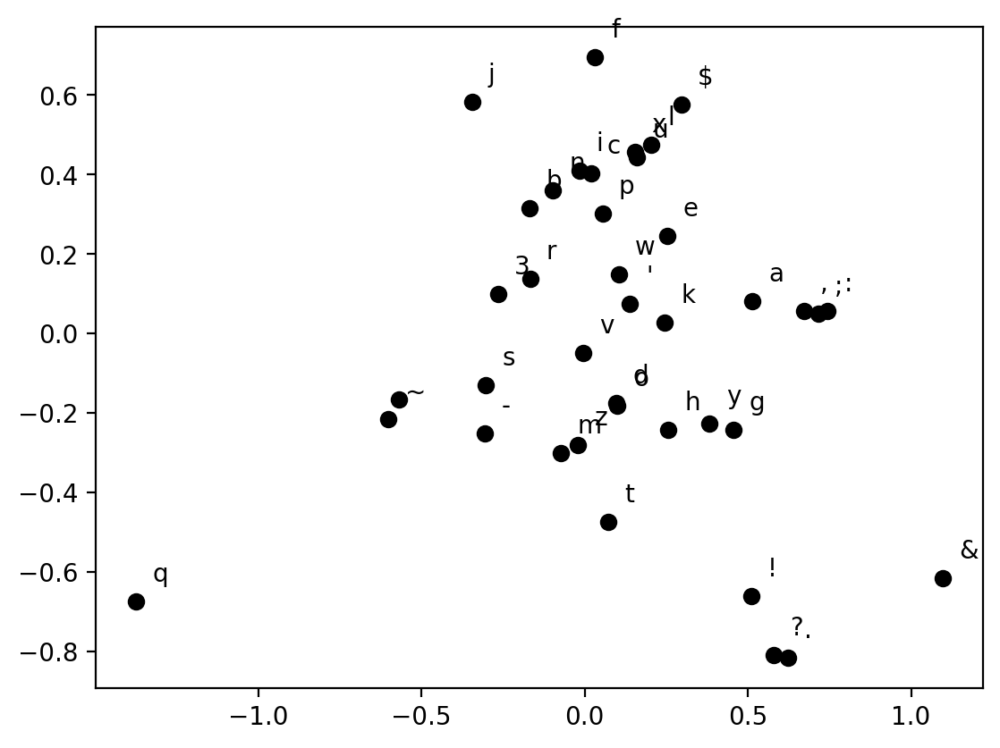

In [43]:
# Visualize the embedding

plot_emb(model.emb, itos)

In [45]:
def print_text(text):
    for chr in text:
        if chr == ':':
            print(":\n",end='')
        else:
            print(chr,end="")

In [46]:
# Generate names from trained model
prompt = ["this is my formula"]
generated_text = generate_name(model, prompt, itos, stoi, block_size, 100)
print_text(generated_text)

 what young but room which with lord:
 this? o, i am my arm what will take you:
 for him; what too, in come in considerate dry:
 o, hail! thou, let bolingbroke:
 to elder, that they almost vincentio of thine, when these thimble, such sweet comes wherefore, camillo:
 but my father, unavoided by my forego:
 way whom how to doom the very give seeming, churchmen, brows faith, 'twas that fall with sir! 'twill therefore i him. and learn thine report to thee! us i am boisterous, and had any way our moon vincentio:
 sleep taking of you, you do not stay

Tuning knobs

1. Embedding size
2. MLP 
3. Context length